In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import exploration as ex # Fichier de fonctions
import pickle
import datetime as dt

# Models
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, r2_score, mean_squared_error

import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

# Imputation valeurs ESS
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Feature importance
import shap

#Modélisation 3D
from mpl_toolkits.mplot3d import Axes3D

/opt/anaconda3/envs/tf/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
PATH_DATA_OUTPUT = '/Users/alexandremonod/Python/OC_ML/projet_3_anticiper_consommation_ges_seattle/data_output'
data = pd.read_pickle(f'{PATH_DATA_OUTPUT}/data_clean.pkl')

In [3]:
# Suppression des variables id
data.drop(columns = ["OSEBuildingID", "CouncilDistrictCode"], inplace = True)

## Preprocessing

Observons l'échelle des distributions afin de déterminer les transformation de variables à effectuer

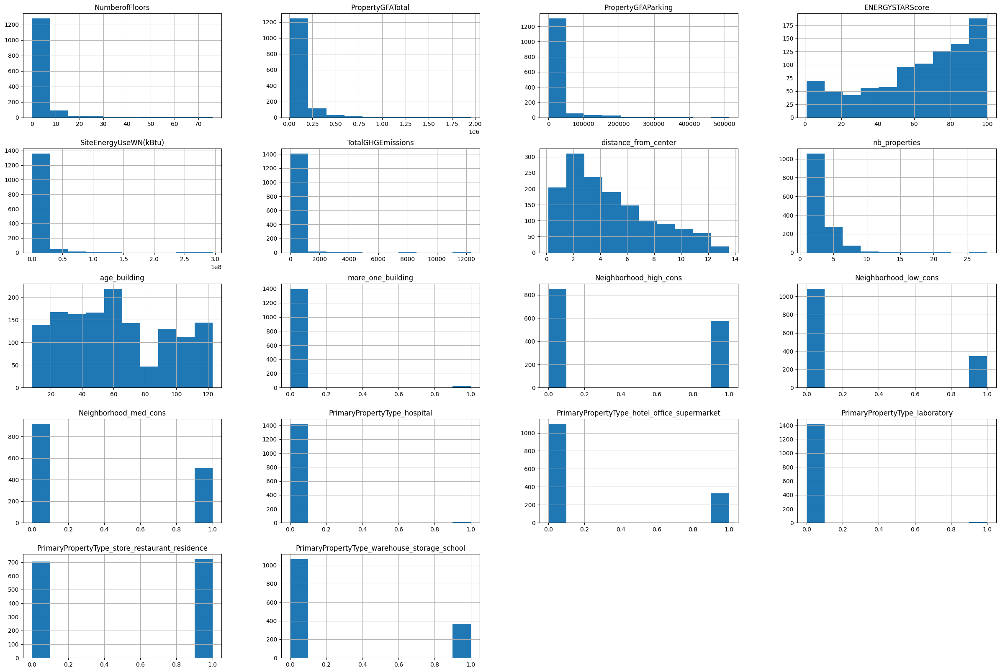

In [4]:
data.hist(figsize=(30, 20))
plt.show()

Afin de réaliser le prépocessing nous allons réaliser les traitements suivant: 


- Aucun traitelment sur la variable more_one_building ni sur les variables dummies : ce sont des booléens.

- Sur les autre variables:
    - Ensuite nous utilisons un RobustScaler(), il s'agit d'un centrage avec une soustraction par la médiane au lieu de la moyenne puis d'une réduction sur l'inter-quartile au lieu de l'équart type

Je supprime la colonne Energy_star, puisqu'on évalue le modèle sans EnergyStar.  
Je la garde dans un second dataframe avec lequel je retesterai tous les modèles.

In [5]:
data_energy_star_score = data.copy()
data.drop(columns="ENERGYSTARScore", inplace=True)

In [7]:
from sklearn.model_selection import train_test_split 

X = data.drop(columns=["SiteEnergyUseWN(kBtu)", "TotalGHGEmissions"])
y_energy = data["SiteEnergyUseWN(kBtu)"]
y_co2 = data["TotalGHGEmissions"]


X_energy_train, X_energy_test, y_energy_train, y_energy_test = train_test_split(X,y_energy, test_size=0.2, random_state=42)
X_co2_train, X_co2_test, y_co2_train, y_co2_test = train_test_split(X,y_co2, test_size=0.2, random_state=42)

print(f"Nombre d'observations du jeu d'entraînement pour la prédicton de consommation d'énergie : {X_energy_train.shape[0]}")
print(f"Nombre d'observations du jeu d'entraînement pour la prédicton des émissions de CO2: {X_co2_train.shape[0]}")
print(f"Nombre d'observations du jeu de test pour la prédiction de consommation d'énergie: {X_energy_test.shape[0]}")
print(f"Nombre d'observations du jeu de test pour la prédiction des émissions de CO2 : {X_co2_test.shape[0]}")

Nombre d'observations du jeu d'entraînement pour la prédicton de consommation d'énergie : 1142
Nombre d'observations du jeu d'entraînement pour la prédicton des émissions de CO2: 1142
Nombre d'observations du jeu de test pour la prédiction de consommation d'énergie: 286
Nombre d'observations du jeu de test pour la prédiction des émissions de CO2 : 286


# Avec la variable energy

### Construction des modèles baseline

In [10]:
param_reglin = {'normalize': [True, False], 
              'fit_intercept': [True, False]}

# Define the scoring metrics
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred)))

baseline_reglin =  Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(LinearRegression(),
                              param_grid=param_reglin,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              verbose=3
                              ))])

baseline_energy_model = baseline_reglin.fit(X_energy_train, y_energy_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END fit_intercept=True, normalize=True; r2: (train=0.556, test=0.275) rmse: (train=13264942.416, test=8995329.812) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=True; r2: (train=0.445, test=0.595) rmse: (train=11203529.362, test=17857615.338) total time=   0.0s
[CV 3/5] END fit_intercept=True, normalize=True; r2: (train=0.538, test=0.555) rmse: (train=13396607.966, test=7975951.988) total time=   0.0s
[CV 4/5] END fit_intercept=True, normalize=True; r2: (train=0.516, test=0.711) rmse: (train=13422195.536, test=7788029.174) total time=   0.0s
[CV 5/5] END fit_intercept=True, normalize=True; r2: (train=0.646, test=0.209) rmse: (train=10544054.631, test=18649279.186) total time=   0.0s
[CV 1/5] END fit_intercept=True, normalize=False; r2: (train=0.556, test=0.284) rmse: (train=13259771.423, test=8940408.066) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=False; r2: (train=0.446, test=0.596)

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs

### METHODE DAOUDA - TargetRegressor : on passe les targets au log ; on sépare les targets des entrées.

import numpy as np
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import TransformedTargetRegressor

# Load data
data = pd.read_csv('data.csv')
X = data.drop('target', axis=1)
y = data['target']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the numeric features and categorical features
numeric_features = ['feature1', 'feature2', 'feature3']
categorical_features = ['feature4', 'feature5']

# Define the transformers
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine the transformers into a preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define the pipeline steps
steps = [
    ('preprocessor', preprocessor),
    ('transformer', TransformedTargetRegressor(regressor=RandomForestRegressor(), transformer=np.log1p, inverse_transformer=np.expm1))
]

# Create the pipeline
pipeline = Pipeline(steps)

# Define hyperparameters to tune
param_grid = {
    'transformer__regressor__n_estimators': [50, 100, 150],
    'transformer__regressor__max_depth': [3, 4, 5, None],
    'transformer__regressor__min_samples_split': [2, 5, 10],
    'transformer__regressor__min_samples_leaf': [1, 2, 4],
    'transformer__regressor__max_features': ['sqrt', 'log2']
}

# Define the list of scoring functions
scoring = {
    'mse': make_scorer(mean_squared_error, greater_is_better=False),
    'r2': make_scorer(r2_score)
}

# Create the grid search object
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring=scoring, refit='mse')

# Fit the pipeline to the training data
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Calculate mean squared error and R-squared
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the results
print('Mean squared error:', mse)
print('R-squared:', r2)

In [11]:
from sklearn import set_config
set_config(display="diagram")

In [12]:
baseline_energy_model

Pipeline(steps=[('log',
                 FunctionTransformer(func=<ufunc 'log1p'>,
                                     inverse_func=<ufunc 'expm1'>)),
                ('Robust', RobustScaler()),
                ('gridsearch_baseline',
                 GridSearchCV(cv=5, estimator=LinearRegression(),
                              param_grid={'fit_intercept': [True, False],
                                          'normalize': [True, False]},
                              refit='r2', return_train_score=True,
                              scoring={'r2': make_scorer(r2_score),
                                       'rmse': make_scorer(<lambda>)},
                              verbose=3))])

In [13]:
# ElasticNet

### Param grid
param_elastic = {
               'alpha': np.logspace(-5, 5, 100, endpoint=True),
               'l1_ratio':  np.arange(0, 1, 0.01)}

### Model pipeline
elasticnet_grid_cv = Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(ElasticNet(),
                              param_grid=param_elastic,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

elasticnet_energy_model=elasticnet_grid_cv.fit(X_energy_train, y_energy_train)

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.035e+16, tolerance: 3.615e+13 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.725e+16, tolerance: 2.066e+13 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.208e+16, tolerance: 3.551e+13 Linear regression models with null weig

In [14]:
param_knn = {'n_neighbors': np.arange(1, 100)}

knn_grid_cv = Pipeline(steps=[
                             ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                             ('Robust', RobustScaler()),
                        ("gridsearch_baseline", GridSearchCV(KNeighborsRegressor(),
                                param_grid=param_knn,
                                cv=5, 
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

knn_energy_model = knn_grid_cv.fit(X_energy_train, y_energy_train)

In [15]:
param_rf = {'n_estimators': [200],
           'max_depth': [2, 3, 5, 10],
           "min_samples_split":[10, 20, 30],
           "min_samples_leaf": [5, 10, 20, 50],
           #'max_features': [len(data.columns)/4, len(data.columns)/3, len(data.columns)/2] # Finalement pas compris ce que c'était
           }

rf_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(RandomForestRegressor(),
                              param_grid=param_rf,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

rf_energy_model = rf_grid_cv.fit(X_energy_train, y_energy_train)

In [16]:
param_gb = {'n_estimators': [100, 200, 300],
           "min_samples_split":[10, 20, 30],
           "min_samples_leaf": [1, 5, 10],
           'max_features': [round(data.shape[1]/4), round(data.shape[1]/3), round(data.shape[1]/2)],
           'max_depth': [None, 5, 10, 20]
           #"learning_rate":[]
           }

gb_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(GradientBoostingRegressor(),
                              param_grid=param_gb,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

gb_energy_model = gb_grid_cv.fit(X_energy_train, y_energy_train)


In [17]:
param_xgb = {
            'max_depth': [3, 5, 7],
            'learning_rate': [0.01, 0.05, 0.1],
            'n_estimators': [100, 300, 600, 1000],
            'reg_lambda': [0.1, 0.5, 1],
            "gamma":[0, 0.5, 1],
            "reg_alpha":[0.1, 0.5, 1]
            }

xgb_grid_cv = Pipeline(steps=[
                            ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                            ('Robust', RobustScaler()),
                            ("gridsearch_baseline", GridSearchCV(xgb.XGBRegressor(),
                                param_grid=param_xgb,
                                cv=5,
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

xgb_energy_model = xgb_grid_cv.fit(X_energy_train, y_energy_train)

# Avec la variable CO2

### Construction des modèles baseline

In [18]:
param_reglin = {'normalize': [True, False], 
              'fit_intercept': [True, False]}

# Define the scoring metrics
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred)))

baseline_reglin =  Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(LinearRegression(),
                              param_grid=param_reglin,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              verbose=3
                              ))])

baseline_co2_model = baseline_reglin.fit(X_co2_train, y_co2_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END fit_intercept=True, normalize=True; r2: (train=0.573, test=0.147) rmse: (train=381.269, test=238.058) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=True; r2: (train=0.468, test=0.514) rmse: (train=238.933, test=694.514) total time=   0.0s
[CV 3/5] END fit_intercept=True, normalize=True; r2: (train=0.574, test=0.266) rmse: (train=376.739, test=262.456) total time=   0.0s
[CV 4/5] END fit_intercept=True, normalize=True; r2: (train=0.535, test=0.681) rmse: (train=380.662, test=241.273) total time=   0.0s
[CV 5/5] END fit_intercept=True, normalize=True; r2: (train=0.596, test=-0.236) rmse: (train=368.058, test=325.604) total time=   0.0s
[CV 1/5] END fit_intercept=True, normalize=False; r2: (train=0.573, test=0.152) rmse: (train=381.169, test=237.249) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=False; r2: (train=0.469, test=0.513) rmse: (train=238.834, test=694.705) total time=   0.0s

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs

A DAOUDA : en faisant ainsi, en mettant le log_scaler dans le pipeline, ne va-t-on pas scaler toutes les variables test aussi ??

In [19]:
# ElasticNet

### Param grid
param_elastic = {
               'alpha': np.logspace(-5, 5, 50, endpoint=True),
               'l1_ratio':  np.arange(0, 1, 0.1)}

### Model pipeline
elasticnet_grid_cv = Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(ElasticNet(),
                              param_grid=param_elastic,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

elasticnet_co2_model=elasticnet_grid_cv.fit(X_co2_train, y_co2_train)

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.648e+07, tolerance: 3.105e+04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.611e+07, tolerance: 9.802e+03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.500e+07, tolerance: 3.048e+04 Linear regression models with null weig

In [20]:
param_knn = {'n_neighbors': np.arange(1, 100)}

knn_grid_cv = Pipeline(steps=[
                             ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                             ('Robust', RobustScaler()),
                        ("gridsearch_baseline", GridSearchCV(KNeighborsRegressor(),
                                param_grid=param_knn,
                                cv=5, 
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

knn_co2_model = knn_grid_cv.fit(X_co2_train, y_co2_train)

In [21]:
rf_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(RandomForestRegressor(),
                              param_grid=param_rf,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

rf_co2_model = rf_grid_cv.fit(X_co2_train, y_co2_train)

In [22]:
gb_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(GradientBoostingRegressor(),
                              param_grid=param_gb,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

gb_co2_model = gb_grid_cv.fit(X_co2_train, y_co2_train)


In [23]:
xgb_grid_cv = Pipeline(steps=[
                            ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                            ('Robust', RobustScaler()),
                            ("gridsearch_baseline", GridSearchCV(xgb.XGBRegressor(),
                                param_grid=param_xgb,
                                cv=5,
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

xgb_co2_model = xgb_grid_cv.fit(X_co2_train, y_co2_train)

# Rajout de la variable ENERGYStarScore

In [24]:
temp_iputation_ESS = pd.read_pickle(f'{PATH_DATA_OUTPUT}/data_clean.pkl')

# Imputation IterativeImputer
imputer = IterativeImputer(random_state=42)
imputed = imputer.fit_transform(temp_iputation_ESS)
data_energy_star_score_imputed = pd.DataFrame(imputed, columns=temp_iputation_ESS.columns)

In [25]:
#data_energy_star_score.dropna(inplace=True)
data_energy_star_score = data_energy_star_score_imputed
X_ESS = data_energy_star_score.drop(columns=["SiteEnergyUseWN(kBtu)", "TotalGHGEmissions"])
y_energy_ESS = data_energy_star_score["SiteEnergyUseWN(kBtu)"]
y_co2_ESS = data_energy_star_score["TotalGHGEmissions"]

X_energy_train_ESS, X_energy_test_ESS, y_energy_train_ESS, y_energy_test_ESS = train_test_split(X_ESS,y_energy_ESS, test_size=0.2, random_state=42)
X_co2_train_ESS, X_co2_test_ESS, y_co2_train_ESS, y_co2_test_ESS = train_test_split(X_ESS,y_co2_ESS, test_size=0.2, random_state=42)

# Avec la variable energy

### Construction des modèles baseline

In [26]:
param_reglin = {'normalize': [True, False], 
              'fit_intercept': [True, False]}

# Define the scoring metrics
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred)))

baseline_reglin =  Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(LinearRegression(),
                              param_grid=param_reglin,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              verbose=3
                              ))])

baseline_energy_model_ESS = baseline_reglin.fit(X_energy_train_ESS, y_energy_train_ESS)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END fit_intercept=True, normalize=True; r2: (train=0.568, test=0.310) rmse: (train=13076902.596, test=8775735.887) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=True; r2: (train=0.463, test=0.605) rmse: (train=11022498.823, test=17643396.773) total time=   0.0s
[CV 3/5] END fit_intercept=True, normalize=True; r2: (train=0.548, test=0.605) rmse: (train=13245592.334, test=7514698.557) total time=   0.0s
[CV 4/5] END fit_intercept=True, normalize=True; r2: (train=0.529, test=0.721) rmse: (train=13229476.426, test=7642899.665) total time=   0.0s
[CV 5/5] END fit_intercept=True, normalize=True; r2: (train=0.661, test=0.218) rmse: (train=10324645.364, test=18549563.154) total time=   0.0s
[CV 1/5] END fit_intercept=True, normalize=False; r2: (train=0.568, test=0.311) rmse: (train=13076731.577, test=8769786.403) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=False; r2: (train=0.464, test=0.606)

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs

In [27]:
# ElasticNet

### Param grid
param_elastic = {
               'alpha': np.logspace(-5, 5, 100, endpoint=True),
               'l1_ratio':  np.arange(0, 1, 0.01)}

### model_ESS pipeline
elasticnet_grid_cv = Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(ElasticNet(),
                              param_grid=param_elastic,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

elasticnet_energy_model_ESS=elasticnet_grid_cv.fit(X_energy_train_ESS, y_energy_train_ESS)

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.815e+16, tolerance: 3.615e+13 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.545e+16, tolerance: 2.066e+13 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.027e+16, tolerance: 3.551e+13 Linear regression models with null weig

In [28]:
param_knn = {'n_neighbors': np.arange(1, 100)}

knn_grid_cv = Pipeline(steps=[
                             ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                             ('Robust', RobustScaler()),
                        ("gridsearch_baseline", GridSearchCV(KNeighborsRegressor(),
                                param_grid=param_knn,
                                cv=5, 
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

knn_energy_model_ESS = knn_grid_cv.fit(X_energy_train_ESS, y_energy_train_ESS)

In [29]:
rf_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(RandomForestRegressor(),
                              param_grid=param_rf,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

rf_energy_model_ESS = rf_grid_cv.fit(X_energy_train_ESS, y_energy_train_ESS)

In [30]:
gb_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(GradientBoostingRegressor(),
                              param_grid=param_gb,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

gb_energy_model_ESS = gb_grid_cv.fit(X_energy_train_ESS, y_energy_train_ESS)


In [31]:
xgb_grid_cv = Pipeline(steps=[
                            ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                            ('Robust', RobustScaler()),
                            ("gridsearch_baseline", GridSearchCV(xgb.XGBRegressor(),
                                param_grid=param_xgb,
                                cv=5,
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

xgb_energy_model_ESS = xgb_grid_cv.fit(X_energy_train_ESS, y_energy_train_ESS)

# Avec la variable CO2

### Construction des modèles baseline

In [32]:
param_reglin = {'normalize': [True, False], 
              'fit_intercept': [True, False]}

# Define the scoring metrics
r2_scorer = make_scorer(r2_score)
rmse_scorer = make_scorer(lambda y, y_pred: np.sqrt(mean_squared_error(y, y_pred)))

baseline_reglin =  Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(LinearRegression(),
                              param_grid=param_reglin,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              verbose=3
                              ))])

baseline_co2_model_ESS = baseline_reglin.fit(X_co2_train_ESS, y_co2_train_ESS)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END fit_intercept=True, normalize=True; r2: (train=0.578, test=0.157) rmse: (train=378.849, test=236.603) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=True; r2: (train=0.483, test=0.517) rmse: (train=235.551, test=692.042) total time=   0.0s
[CV 3/5] END fit_intercept=True, normalize=True; r2: (train=0.578, test=0.299) rmse: (train=375.157, test=256.435) total time=   0.0s
[CV 4/5] END fit_intercept=True, normalize=True; r2: (train=0.540, test=0.689) rmse: (train=378.582, test=237.926) total time=   0.0s
[CV 5/5] END fit_intercept=True, normalize=True; r2: (train=0.601, test=-0.235) rmse: (train=365.862, test=325.533) total time=   0.0s
[CV 1/5] END fit_intercept=True, normalize=False; r2: (train=0.578, test=0.159) rmse: (train=378.800, test=236.369) total time=   0.0s
[CV 2/5] END fit_intercept=True, normalize=False; r2: (train=0.484, test=0.517) rmse: (train=235.415, test=692.401) total time=   0.0s

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs

In [33]:
# ElasticNet

### Param grid
param_elastic = {
               'alpha': np.logspace(-5, 5, 100, endpoint=True),
               'l1_ratio':  np.arange(0, 1, 0.01)}

### model_ESS pipeline
elasticnet_grid_cv = Pipeline(steps=[
                                  ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                                  ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(ElasticNet(),
                              param_grid=param_elastic,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

elasticnet_co2_model_ESS=elasticnet_grid_cv.fit(X_co2_train_ESS, y_co2_train_ESS)

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.565e+07, tolerance: 3.105e+04 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.537e+07, tolerance: 9.802e+03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.447e+07, tolerance: 3.048e+04 Linear regression models with null weig

In [34]:
param_knn = {'n_neighbors': np.arange(1, 100)}

knn_grid_cv = Pipeline(steps=[
                             ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                             ('Robust', RobustScaler()),
                        ("gridsearch_baseline", GridSearchCV(KNeighborsRegressor(),
                                param_grid=param_knn,
                                cv=5, 
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

knn_co2_model_ESS = knn_grid_cv.fit(X_co2_train_ESS, y_co2_train_ESS)

In [35]:
rf_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(RandomForestRegressor(),
                              param_grid=param_rf,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

rf_co2_model_ESS = rf_grid_cv.fit(X_co2_train_ESS, y_co2_train_ESS)

In [36]:
gb_grid_cv = Pipeline(steps=[
                           ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                           ('Robust', RobustScaler()),
                          ("gridsearch_baseline", GridSearchCV(GradientBoostingRegressor(),
                              param_grid=param_gb,
                              cv=5, 
                              scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                              return_train_score = True,
                              refit="r2",
                              ))])

gb_co2_model_ESS = gb_grid_cv.fit(X_co2_train_ESS, y_co2_train_ESS)


In [37]:
xgb_grid_cv = Pipeline(steps=[
                            ('log', FunctionTransformer(func=np.log1p, inverse_func=np.expm1)),
                            ('Robust', RobustScaler()),
                            ("gridsearch_baseline", GridSearchCV(xgb.XGBRegressor(),
                                param_grid=param_xgb,
                                cv=5,
                                scoring={'r2': r2_scorer, 'rmse': rmse_scorer},
                                return_train_score = True,
                                refit="r2",
                                ))])

xgb_co2_model_ESS = xgb_grid_cv.fit(X_co2_train_ESS, y_co2_train_ESS)

In [38]:
pd.DataFrame(elasticnet_energy_model.named_steps["gridsearch_baseline"].cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_l1_ratio,params,split0_test_r2,split1_test_r2,split2_test_r2,...,mean_test_rmse,std_test_rmse,rank_test_rmse,split0_train_rmse,split1_train_rmse,split2_train_rmse,split3_train_rmse,split4_train_rmse,mean_train_rmse,std_train_rmse
0,0.011728,0.002759,0.000441,0.000172,0.00001,0.0,"{'alpha': 1e-05, 'l1_ratio': 0.0}",0.283748,0.594120,0.560109,...,1.223422e+07,4.950263e+06,9534,1.325980e+07,1.119417e+07,1.339383e+07,1.342125e+07,1.054339e+07,1.236249e+07,1.238054e+06
1,0.010589,0.000940,0.000343,0.000054,0.00001,0.01,"{'alpha': 1e-05, 'l1_ratio': 0.01}",0.283752,0.594134,0.560110,...,1.223416e+07,4.950230e+06,9537,1.325980e+07,1.119417e+07,1.339383e+07,1.342125e+07,1.054339e+07,1.236249e+07,1.238054e+06
2,0.009872,0.000836,0.000294,0.000022,0.00001,0.02,"{'alpha': 1e-05, 'l1_ratio': 0.02}",0.283755,0.594148,0.560112,...,1.223411e+07,4.950197e+06,9543,1.325980e+07,1.119417e+07,1.339383e+07,1.342125e+07,1.054339e+07,1.236249e+07,1.238055e+06
3,0.010049,0.000698,0.000345,0.000082,0.00001,0.03,"{'alpha': 1e-05, 'l1_ratio': 0.03}",0.283758,0.594162,0.560113,...,1.223406e+07,4.950163e+06,9548,1.325980e+07,1.119417e+07,1.339383e+07,1.342125e+07,1.054339e+07,1.236249e+07,1.238055e+06
4,0.009912,0.000919,0.000290,0.000020,0.00001,0.04,"{'alpha': 1e-05, 'l1_ratio': 0.04}",0.283762,0.594176,0.560115,...,1.223400e+07,4.950130e+06,9554,1.325980e+07,1.119417e+07,1.339383e+07,1.342125e+07,1.054339e+07,1.236249e+07,1.238055e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.000427,0.000032,0.000282,0.000010,100000.0,0.95,"{'alpha': 100000.0, 'l1_ratio': 0.950000000000...",-0.028079,-0.004052,0.000879,...,1.724878e+07,6.489621e+06,928,1.989547e+07,1.504122e+07,1.970693e+07,1.927945e+07,1.772832e+07,1.833028e+07,1.812521e+06
9996,0.000410,0.000005,0.000282,0.000002,100000.0,0.96,"{'alpha': 100000.0, 'l1_ratio': 0.96}",-0.027855,-0.004004,0.001116,...,1.724783e+07,6.489847e+06,1022,1.989460e+07,1.504039e+07,1.970621e+07,1.927853e+07,1.772744e+07,1.832944e+07,1.812527e+06
9997,0.000403,0.000004,0.000278,0.000003,100000.0,0.97,"{'alpha': 100000.0, 'l1_ratio': 0.97}",-0.027484,-0.003924,0.001509,...,1.724624e+07,6.490223e+06,1141,1.989317e+07,1.503900e+07,1.970500e+07,1.927701e+07,1.772598e+07,1.832803e+07,1.812537e+06
9998,0.000404,0.000003,0.000276,0.000001,100000.0,0.98,"{'alpha': 100000.0, 'l1_ratio': 0.98}",-0.026746,-0.003764,0.002290,...,1.724308e+07,6.490970e+06,1311,1.989031e+07,1.503624e+07,1.970261e+07,1.927399e+07,1.772308e+07,1.832524e+07,1.812557e+06


In [39]:
# Calcul des scores

def get_scores(model):
    df = pd.DataFrame(model.named_steps["gridsearch_baseline"].cv_results_)
    best_params = model.named_steps["gridsearch_baseline"].best_params_
    model_r2 =  df.loc[df["params"] == best_params].mean_test_r2.values[0]
    model_rmse = df.loc[df["params"] == best_params].mean_test_rmse.values[0]
    model_fit_time = df.loc[df["params"] == best_params].mean_fit_time.values[0]
    return model_r2, model_rmse, model_fit_time

models = [ elasticnet_energy_model, knn_energy_model, rf_energy_model, gb_energy_model, xgb_energy_model
            , elasticnet_co2_model, knn_co2_model, rf_co2_model, gb_co2_model, xgb_co2_model
            , elasticnet_energy_model_ESS, knn_energy_model_ESS, rf_energy_model_ESS, gb_energy_model_ESS, xgb_energy_model_ESS
            , elasticnet_co2_model_ESS, knn_co2_model_ESS, rf_co2_model_ESS, gb_co2_model_ESS, xgb_co2_model_ESS
            ]


model_names = ['EN_energy', 'KNN_energy', 'RF_energy', 'GB_energy', 'XGB_energy'
               , 'EN_co2', 'KNN_co2', 'RF_co2', 'GB_co2', 'XGB_co2'
               , 'EN_energy_ESS', 'KNN_energy_ESS', 'RF_energy_ESS', 'GB_energy_ESS', 'XGB_energy_ESS'
               , 'EN_co2_ESS', 'KNN_co2_ESS', 'RF_co2_ESS', 'GB_co2_ESS', 'XGB_co2_ESS'
               ]

scores = []
for model, name in zip(models, model_names):
    r2, rmse, fit_time = get_scores(model)
    scores.append({'Model': name, 'R2': r2, 'RMSE': rmse, "Fit_time" : fit_time})

df = pd.DataFrame(scores)

# Split the df between models with and without ESS for visualization
df_ESS = df[df['Model'].str.endswith('_ESS')]
df_wo_ESS = df[~df['Model'].str.endswith('_ESS')]

In [67]:
df

,Model,R2,RMSE,Fit_time
0,EN_energy,0.472197,1.222863e+07,0.009994
1,KNN_energy,0.481948,1.266984e+07,0.000640
2,RF_energy,0.522510,1.223090e+07,0.352891
3,GB_energy,0.579772,1.098700e+07,0.406412
4,XGB_energy,0.528427,1.193376e+07,0.055326
5,EN_co2,0.303020,3.683962e+02,0.001465
6,KNN_co2,0.294373,3.842164e+02,0.000634
7,RF_co2,0.300106,3.889396e+02,0.349205
8,GB_co2,0.466298,3.268983e+02,0.075795
9,XGB_co2,0.389406,3.610212e+02,0.048750


R2 de 63% : tb.  
Il faut comparer les modèles entre eux-mêmes, et pas l'un avec l'autre car ils ont des variances très différentes et des étendues très différentes (différence de 10*4).  
On prend donc le modèle avec le meilleur R2 et ENSUITE on cherche le meilleur RMSE dans ce modèle.

In [63]:
# Split the df between models energy and co2 for visualization
df_energy = df[df['Model'].str.contains('energy')].reset_index(drop=True)
df_co2 = df[~df['Model'].str.contains('energy')].reset_index(drop=True)

In [72]:
def plot_model_performance(df, savefig=None):
    # Determine the number of models and the maximum length of their names
    num_models = len(df)
    max_name_length = max([len(name) for name in df['Model']])

    # Set the plot size based on the number of models and the length of their names
    fig, ax = plt.subplots(figsize=(6 + max_name_length * 0.2, 6 + num_models * 0.4))

    # Create the scatter plot
    ax.scatter(df['RMSE'], df['R2'])
    ax.set_xlabel('RMSE')
    ax.set_ylabel('R-squared')

    # Label each point with the corresponding model name
    for i in range(num_models):
        ax.text(df['RMSE'][i]+0.05, df['R2'][i]+0.01, df['Model'][i], fontsize=10)

    # Save the plot to a file if savefig is specified
    if savefig is not None:
        plt.savefig(savefig, bbox_inches='tight')
        plt.show()
    else:
        plt.show()


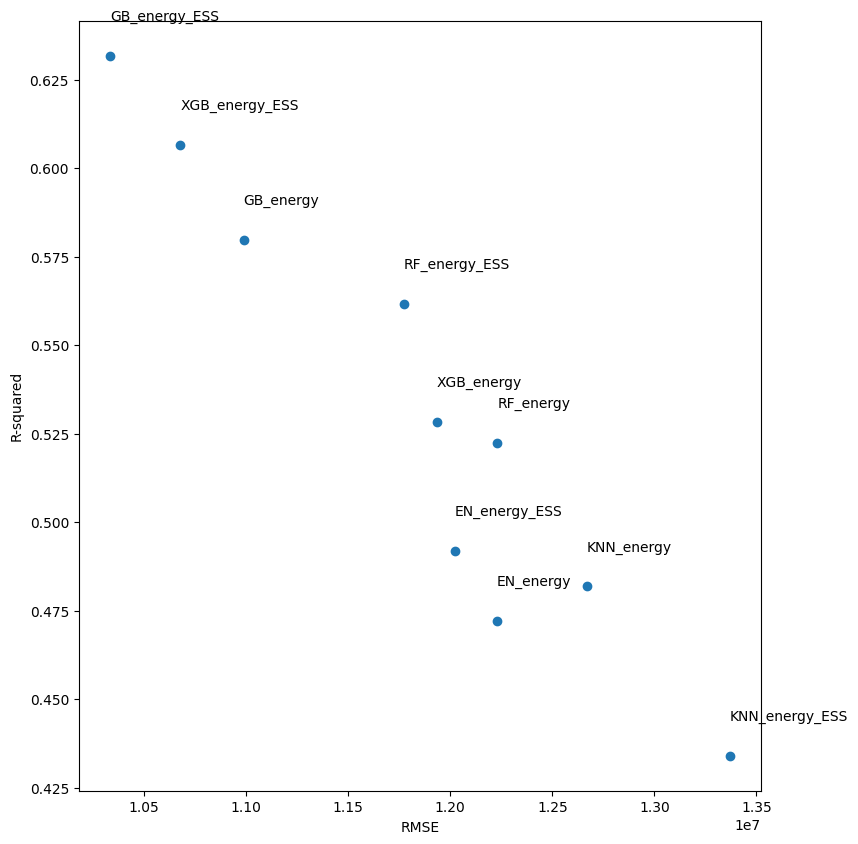

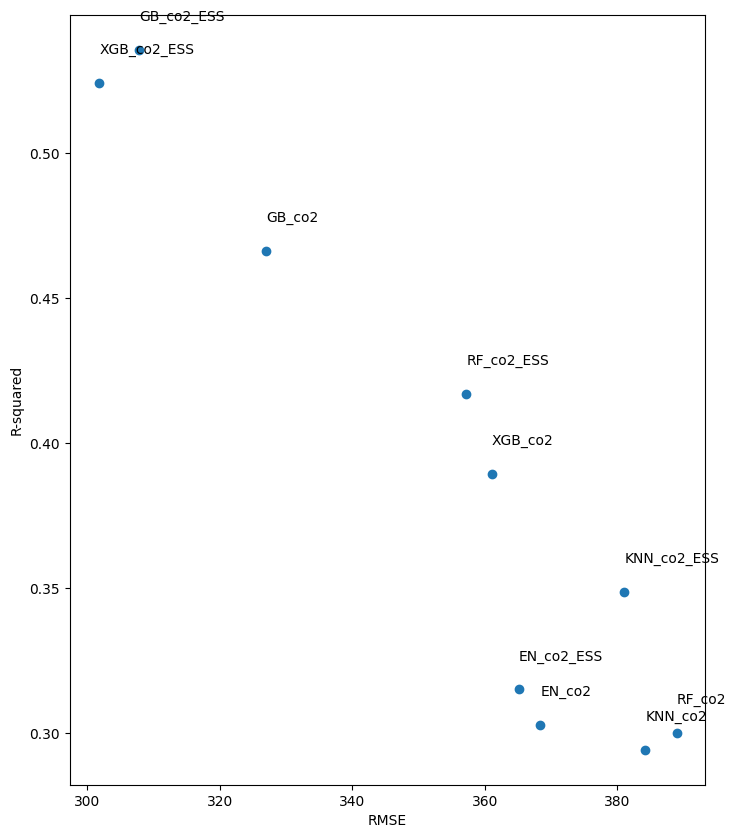

In [74]:
plot_model_performance(df_energy, savefig="model_performance_energy")
plot_model_performance(df_co2, savefig="model_performance_co2")

Les modèles avec EnergyStarScore sont plus performants avec les deux modèles.

In [68]:
def plot_3d_model_performance(df):
    # Determine the number of models and the maximum length of their names
    num_models = len(df)
    max_name_length = max([len(name) for name in df.Model])

    # Set the plot size based on the number of models and the length of their names
    fig = plt.figure(figsize=(8 + max_name_length * 0.2, 8 + num_models * 0.4))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(df['R2'], df['RMSE'], df['Fit_time'], c=df.index, cmap='viridis')
    ax.set_xlabel('R2')
    ax.set_ylabel('RMSE')
    ax.set_zlabel('Fit_time')

    # Label each point with the corresponding model name
    for i in range(num_models):
        ax.text(df['R2'][i]+0.05, df['RMSE'][i]+0.01, df['Fit_time'][i]+0.05, str(df.Model[i]), fontsize=10)

    plt.show()


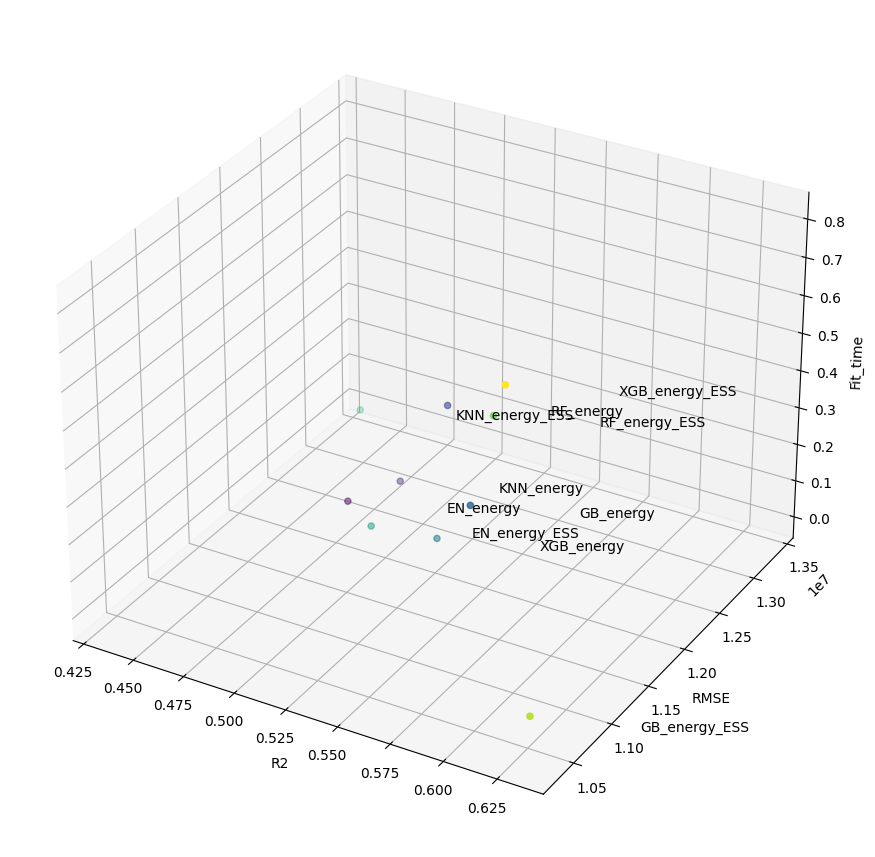

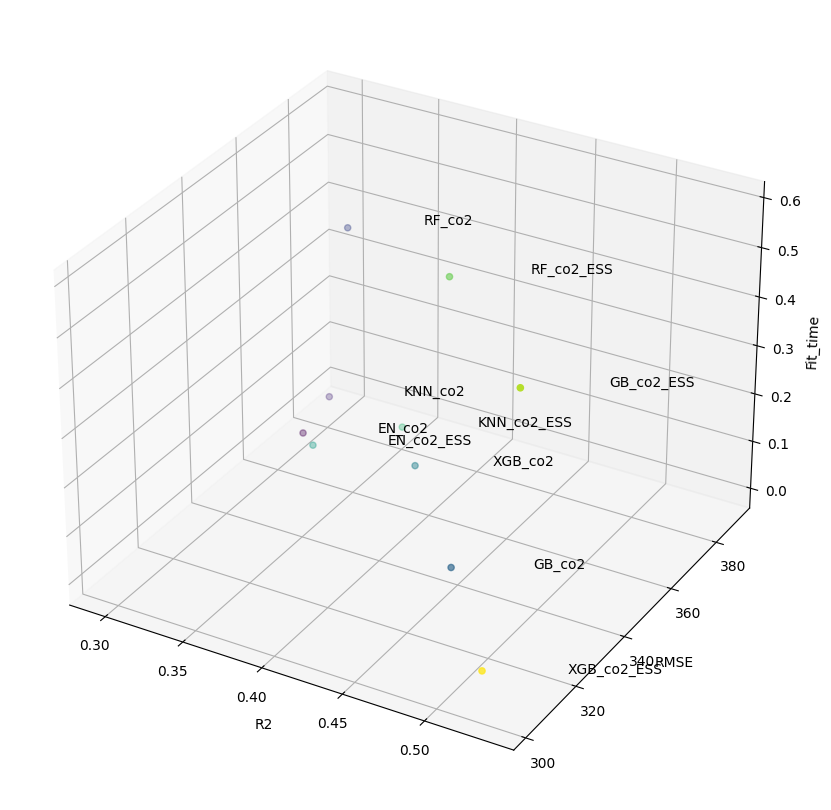

In [70]:
plot_3d_model_performance(df_energy)
plot_3d_model_performance(df_co2)

## Feature Performance

In [85]:
best_models = [gb_energy_model_ESS, gb_co2_model_ESS, xgb_co2_model_ESS]

In [77]:
def plot_shap_summaries(models, data, figsize=(8, 4)):
    """
    Generates SHAP summary plots for multiple models.
    
    Parameters:
    models (list): A list of trained regression models.
    data (pandas.DataFrame): The data for which to generate the SHAP plots.
    figsize (tuple): The size of the plot (default: (8, 4)).
    
    Returns:
    None
    """
    
    # set the figure size
    #plt.rcParams['figure.figsize'] = figsize
    
    # iterate over each model and generate the SHAP summary plot
    for model in models:
        # extract the best estimator from the pipeline
        estimator = model['gridsearch_baseline'].best_estimator_
            
        if isinstance(estimator, GradientBoostingRegressor):
            # for GradientBoostingRegressor, use TreeExplainer
            explainer = shap.TreeExplainer(estimator)
        elif isinstance(estimator, XGBRegressor):
            # for XGBRegressor, use XGBExplainer
            explainer = shap.Explainer(estimator)
        
        # generate the SHAP values for the data
        shap_values = explainer(data)
        
        # Barplot
        shap.summary_plot(shap_values, data, plot_type="bar")
        
        # generate the summary plot
        shap.summary_plot(shap_values, data)
    
    # display the plot
    plt.legend(models)
    plt.show()


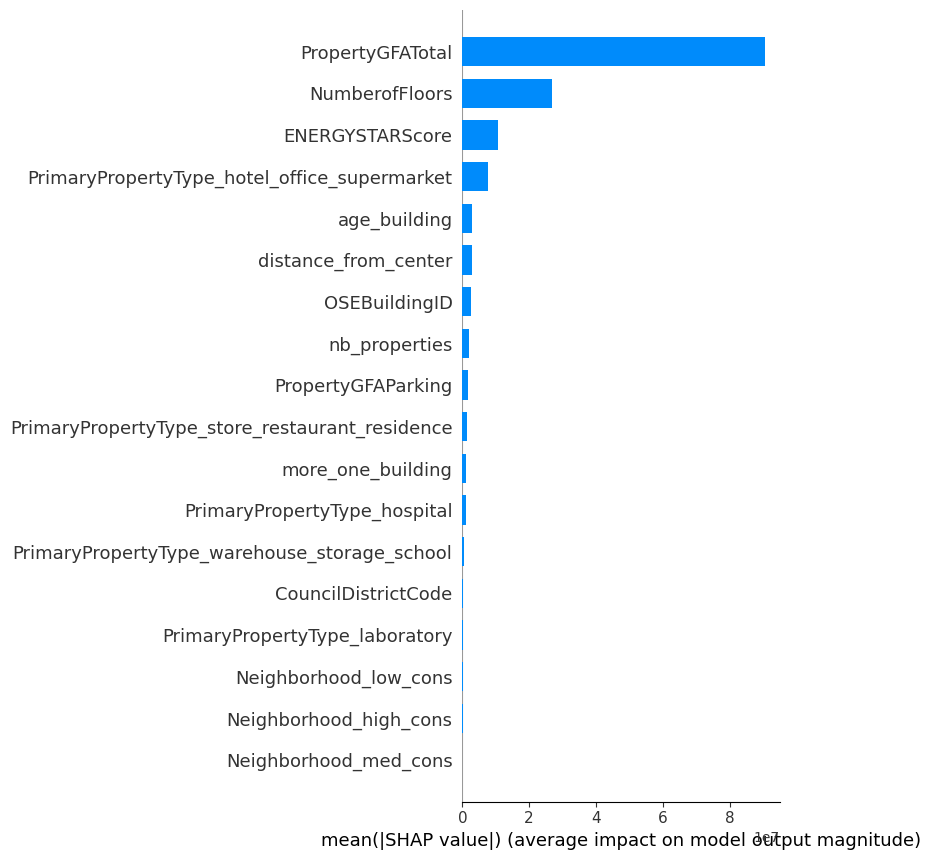

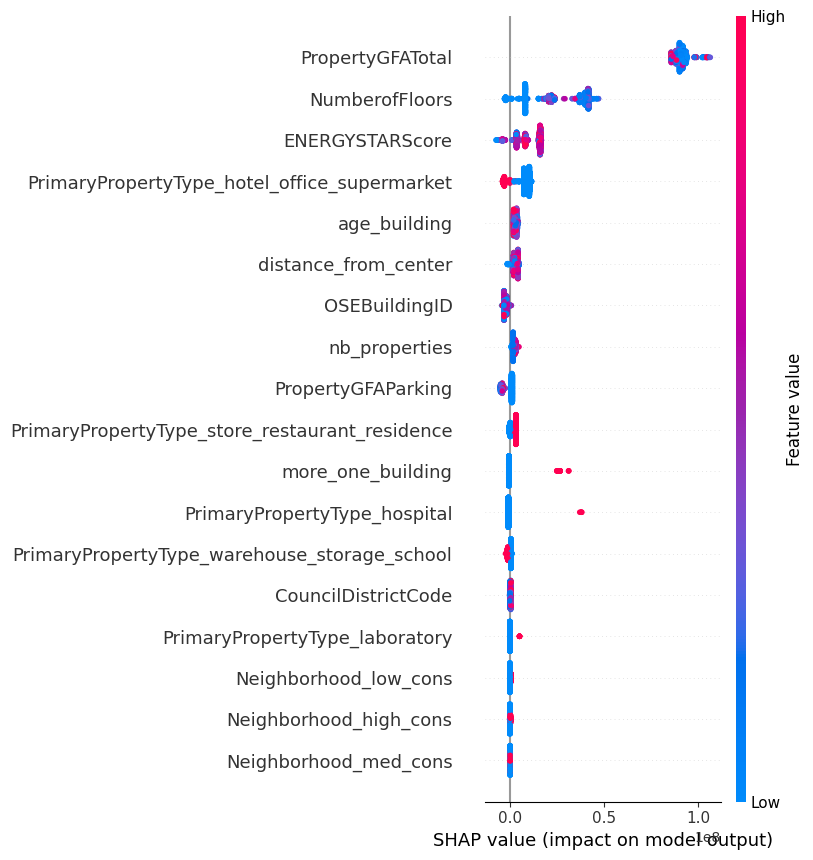

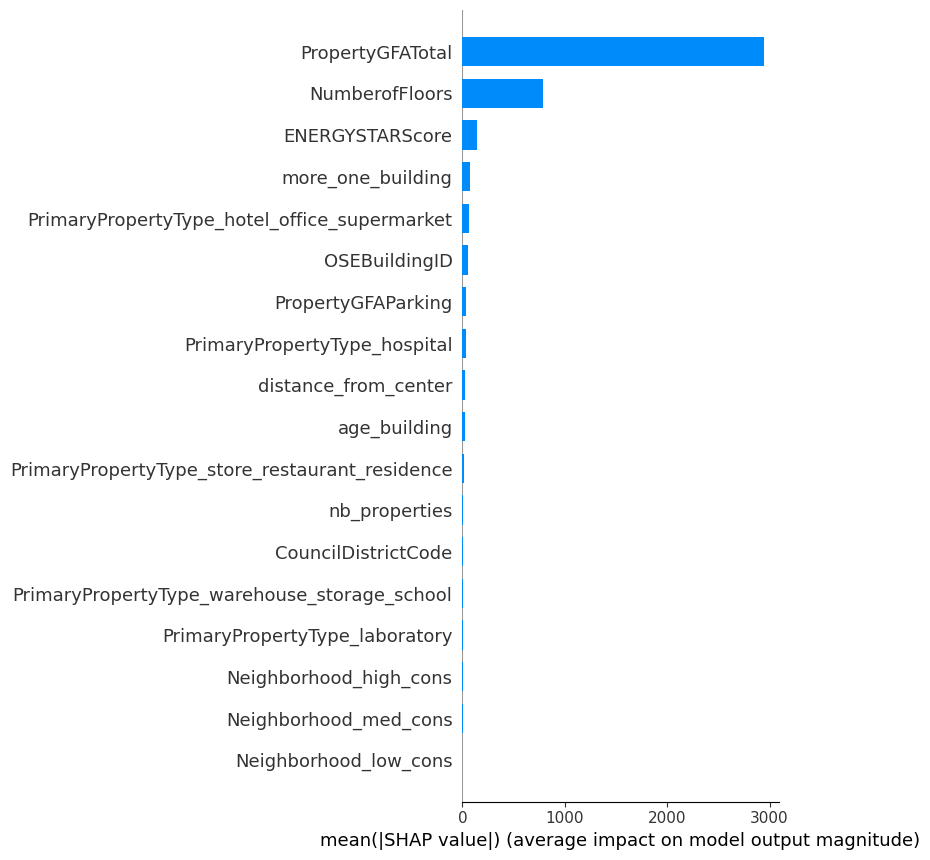

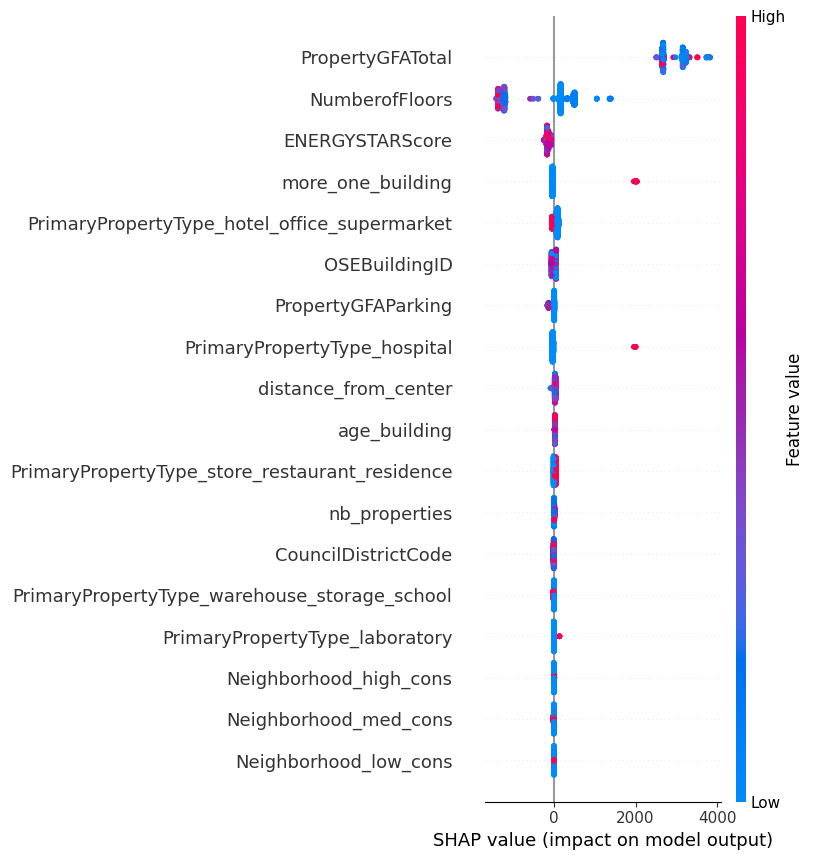

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


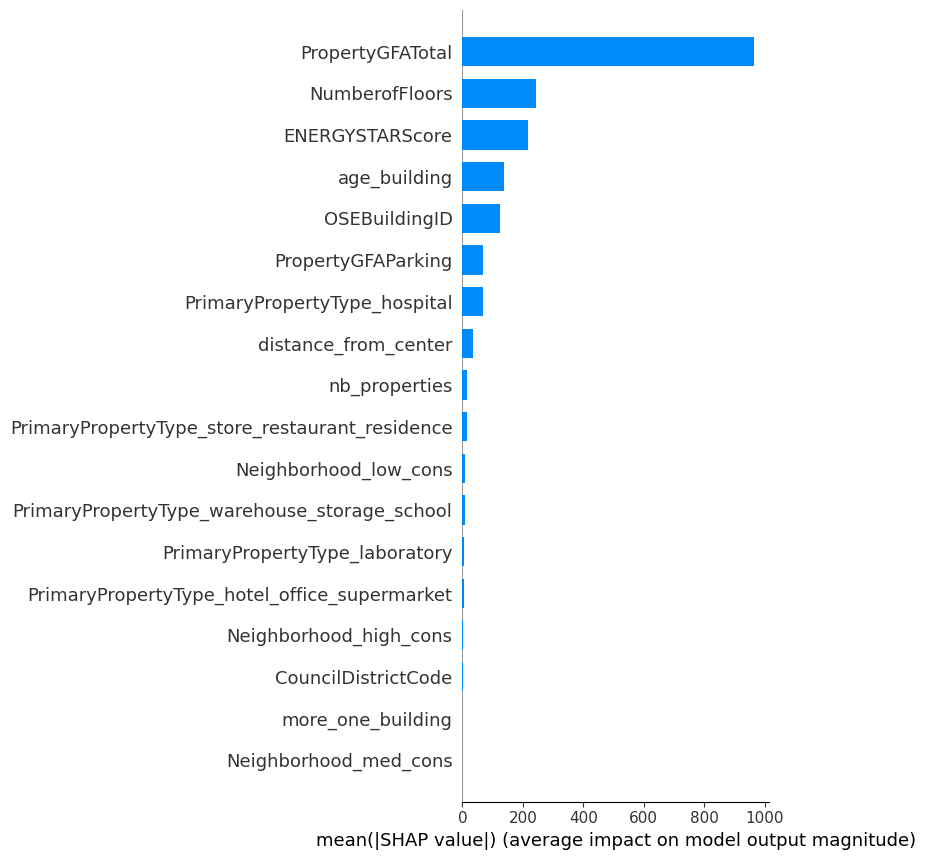

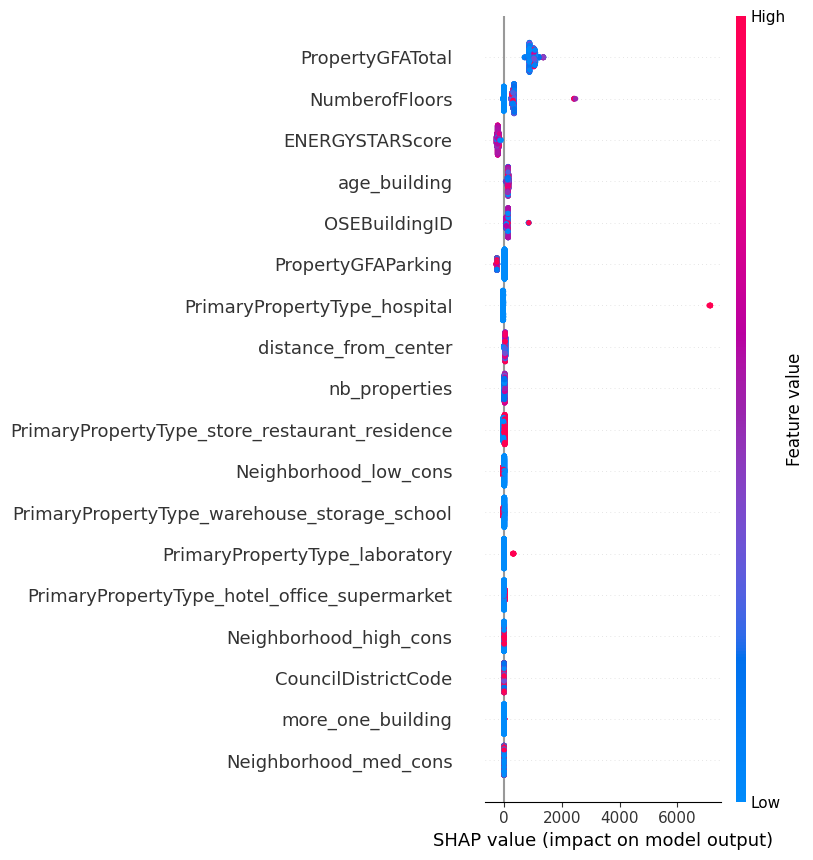

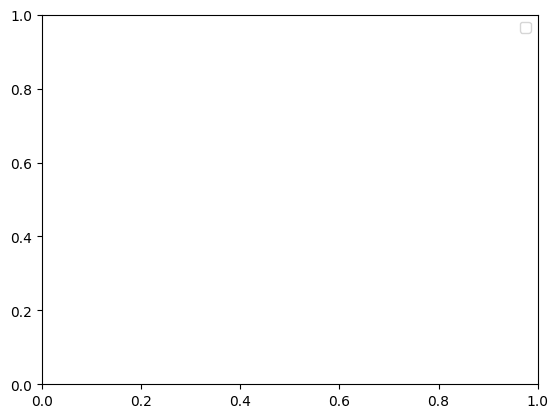

In [89]:
plot_shap_summaries(best_models, X_ESS)